# Cascadia Board Game Scoring — VLM Challenge

**Objective:** Given images of a completed 3-player Cascadia board game, use VLM to:
1. Extract scoring rules from the wildlife scoring cards
2. Count animal tokens per player and note spatial arrangements
3. Calculate wildlife scores per animal type per player
4. Identify habitat tiles and compute habitat scores with majority bonuses
5. Determine the overall winner

**Approach:**
- **Image preprocessing:** Crop each player's board into a separate high-res image for better token detection
- **Multi-step prompting:** rules → per-player counting → verification → scoring
- **Habitat scoring:** Separate VLM pass to identify habitat types and largest contiguous groups


In [1]:
!pip install -q google-generativeai Pillow python-dotenv

import google.generativeai as genai
from PIL import Image, ImageEnhance, ImageFilter
from IPython.display import display, Markdown
from dotenv import load_dotenv
from google.colab import userdata
import os
import time

/usr/local/lib/python3.12/dist-packages/google/colab/_import_hooks/_hook_injector.py:55: FutureWarning: 

All support for the `google.generativeai` package has ended. It will no longer be receiving 
updates or bug fixes. Please switch to the `google.genai` package as soon as possible.
See README for more details:

https://github.com/google-gemini/deprecated-generative-ai-python/blob/main/README.md

  loader.exec_module(module)


## Configure API Key

In [12]:
GEMINI_API_KEY = userdata.get('GOOGLE_API_KEY')
assert GEMINI_API_KEY, "GOOGLE_API_KEY not found in Colab secrets!"

genai.configure(api_key=GEMINI_API_KEY)
model = genai.GenerativeModel("gemini-2.5-flash")

## Load, Preprocess & Crop Images

We split the 3-player board image into individual crops and enhance them for better token detection.

Player boards size: (927, 541)
Scoring card size: (1126, 1999)
Scoring Card:


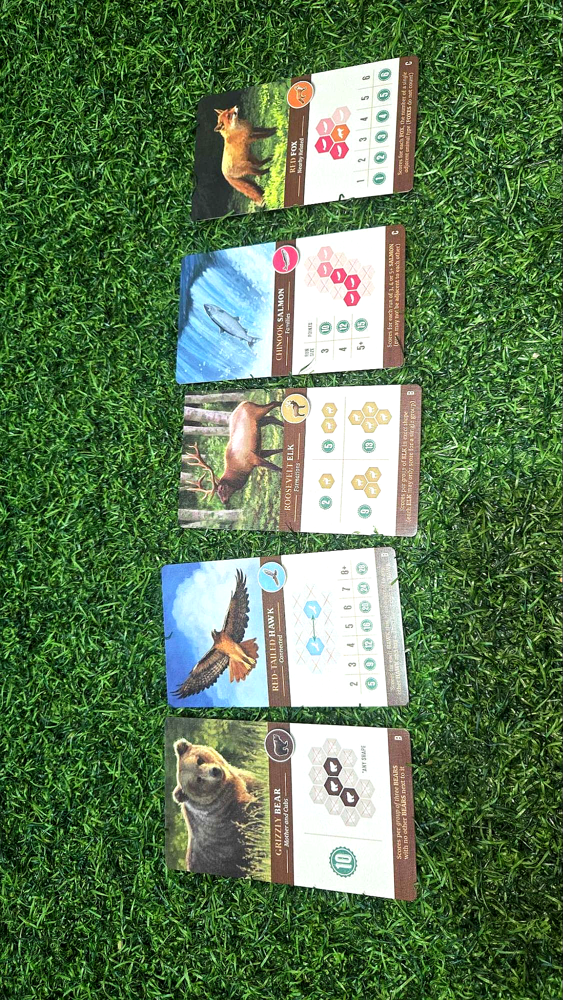


Player 1 (cropped & enhanced, (618, 1082)):


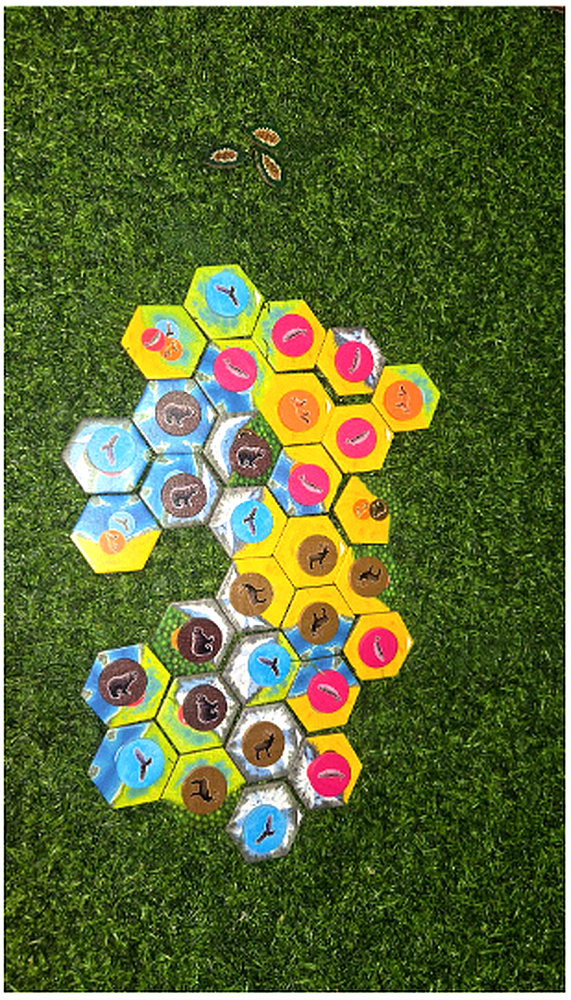


Player 2 (cropped & enhanced, (618, 1082)):


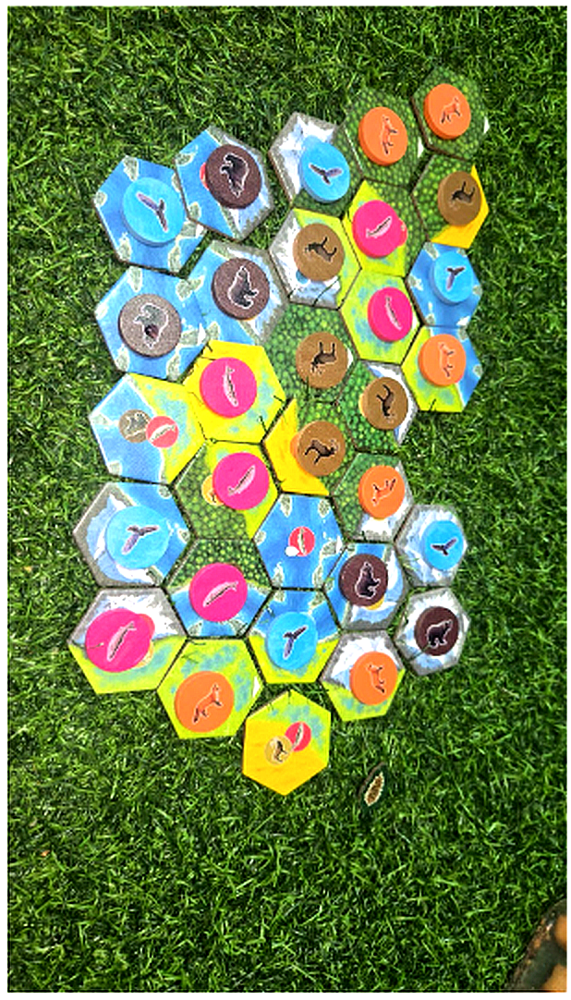


Player 3 (cropped & enhanced, (618, 1082)):


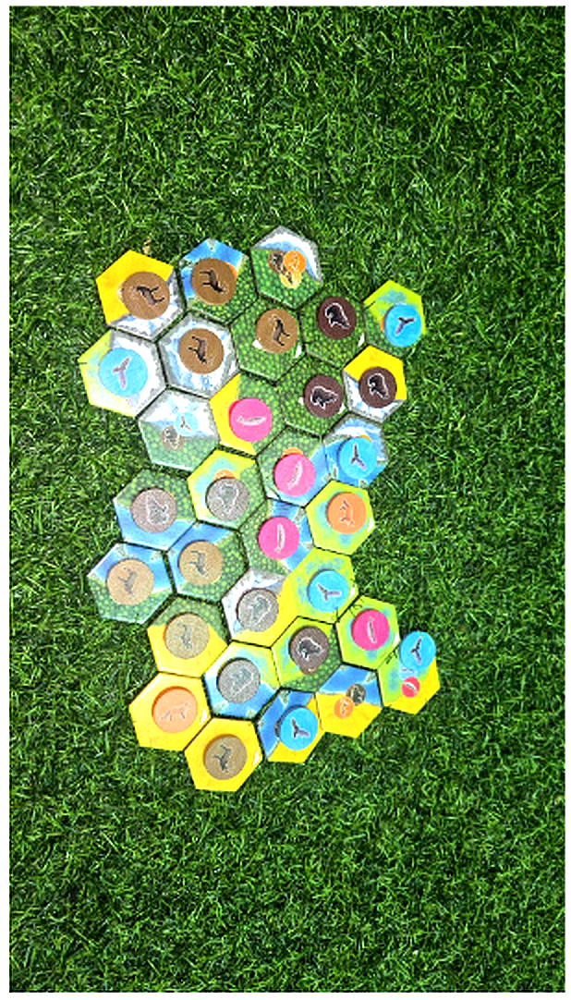


Scoring Sheet (reference only — not sent to API):


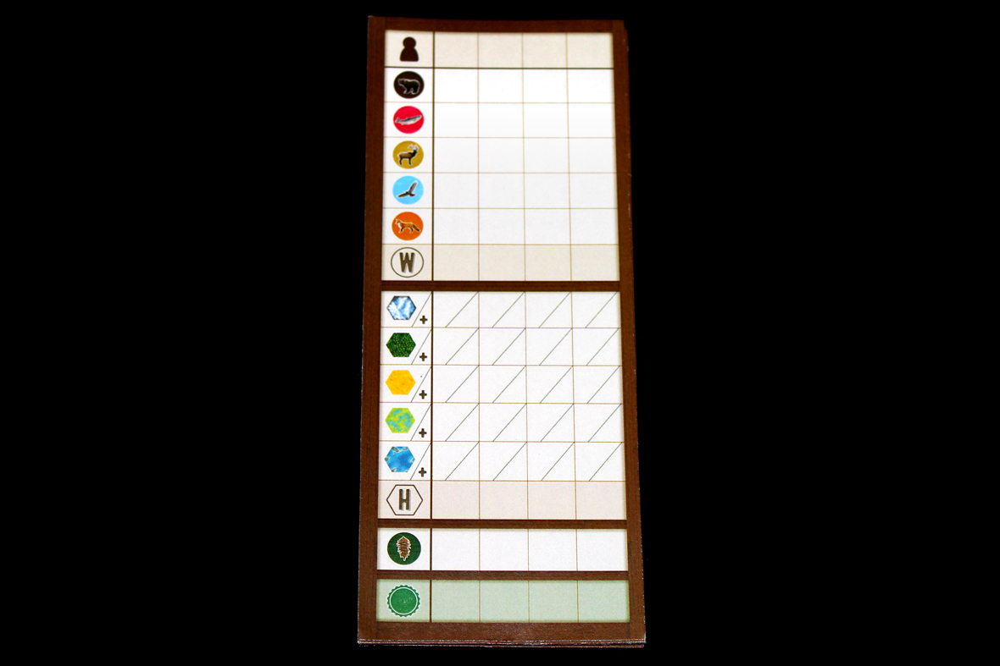

In [5]:
# Load raw images
scoring_card = Image.open("wildlife scoring card.jpg")
player_boards = Image.open("player tiles.png")
scoring_sheet = Image.open("Cascadia Scoring sheet.jpg")

print(f"Player boards size: {player_boards.size}")
print(f"Scoring card size: {scoring_card.size}")

# --- Enhancement helper ---
def enhance_board(img):
    """Sharpen and boost contrast for better token visibility."""
    img = img.filter(ImageFilter.SHARPEN)
    img = ImageEnhance.Contrast(img).enhance(1.3)
    img = ImageEnhance.Sharpness(img).enhance(1.5)
    return img

# --- Crop each player's board ---
# Split the full image into 3 equal vertical strips (left to right = Player 1, 2, 3)
# Adjust these crops if your image layout differs!
w, h = player_boards.size
third = w // 3

player_crops_raw = {
    "Player 1": player_boards.crop((0, 0, third, h)),
    "Player 2": player_boards.crop((third, 0, 2 * third, h)),
    "Player 3": player_boards.crop((2 * third, 0, w, h)),
}

# Enhance + upscale each crop (2x for better detail)
player_crops = {}
for name, crop in player_crops_raw.items():
    upscaled = crop.resize((crop.width * 2, crop.height * 2), Image.LANCZOS)
    player_crops[name] = enhance_board(upscaled)

# Also enhance the scoring card
scoring_card_enhanced = enhance_board(scoring_card)

# Display everything
print("Scoring Card:")
display(scoring_card_enhanced)
for name, img in player_crops.items():
    print(f"\n{name} (cropped & enhanced, {img.size}):")
    display(img)
print("\nScoring Sheet (reference only — not sent to API):")
display(scoring_sheet)

## Configuration: Nature Tokens (Manual Entry)
Nature tokens are kept off the board and cannot be detected from images. Enter counts before running.

In [7]:
# Each nature token = 1 point. Edit these values before running.
nature_tokens = {
    "Player 1": 3,
    "Player 2": 1,
    "Player 3": 0,
}
print("Nature token counts:", nature_tokens)

Nature token counts: {'Player 1': 3, 'Player 2': 1, 'Player 3': 0}


## Step 1: Extract Scoring Rules

In [13]:
rules_response = model.generate_content([
    scoring_card_enhanced,
    """These are Cascadia wildlife scoring cards used in a game.
For each animal (bear, elk, hawk, salmon, fox), describe the EXACT scoring rules shown on the cards.

Be very precise about:
- What spatial arrangement scores points (pairs, groups, lines, adjacency, etc.)
- Exactly how many points each arrangement is worth
- Any bonus conditions

Format your answer clearly with one section per animal."""
])

display(Markdown(rules_response.text))

Here are the exact scoring rules for each animal as shown on the Cascadia wildlife scoring cards:

---

### GRIZZLY BEAR (Mother and Cubs)

*   **Spatial Arrangement:** Scores points for each distinct group of exactly three adjacent Grizzly Bears. The specific shape of the three bears (e.g., linear, triangular) does not matter, as long as they are adjacent to each other.
*   **Bonus Condition:** Each scoring group of three Grizzly Bears must be isolated; no other Grizzly Bear tokens can be adjacent to any bear within that scoring group.
*   **Points:** 10 points per such isolated group of three Grizzly Bears.

---

### RED-TAILED HAWK (Connected)

*   **Spatial Arrangement:** Scores points based on the size of the single largest group of connected (adjacent) Red-Tailed Hawks.
*   **Points:**
    *   A group of 2 Hawks: 5 points
    *   A group of 3 Hawks: 8 points
    *   A group of 4 Hawks: 12 points
    *   A group of 5 Hawks: 16 points
    *   A group of 6 Hawks: 20 points
    *   A group of 7 Hawks: 24 points
    *   A group of 8 or more Hawks: 28 points

---

### ROOSEVELT ELK (Formations)

*   **Spatial Arrangement:** Scores points for forming specific arrangements of adjacent Roosevelt Elk tokens. Each individual Elk token can only be part of one scoring formation.
    *   **Formation 1:** Two adjacent Elk tokens.
    *   **Formation 2:** Three adjacent Elk tokens arranged in a small triangular cluster.
    *   **Formation 3:** Four adjacent Elk tokens in a linear formation.
    *   **Formation 4:** Five adjacent Elk tokens in a cross-like formation (one central Elk with four others surrounding it).
*   **Points:**
    *   Formation of 2 Elk: 5 points
    *   Formation of 3 Elk: 9 points
    *   Formation of 4 Elk: 13 points
    *   Formation of 5 Elk: 18 points

---

### CHINOOK SALMON (Families)

*   **Spatial Arrangement:** Scores points for each "run" of 3, 4, or 5+ Chinook Salmon. A "run" refers to a straight line of habitat tiles where each tile in that line contains a salmon token.
*   **Bonus Condition:** The card explicitly states: "(they may not be adjacent to each other)". This condition typically means that individual salmon tokens can only score once and cannot be part of two separate scoring runs if they overlap.
*   **Points:** The points awarded depend on the "Run Size" (the number of salmon tokens in the scoring run):
    *   Run Size 3: 10 points
    *   Run Size 4: 12 points
    *   Run Size 5 or more: 15 points

---

### RED FOX (Nearby Related)

*   **Spatial Arrangement:** Scores points for each individual Red Fox token. For each Red Fox, identify the *single animal type* (excluding other Red Foxes) that is present on the most adjacent habitat tiles.
*   **Bonus Condition:** When counting adjacent animals for a fox, other Red Fox tokens are specifically excluded and do not count towards the total.
*   **Points:** The points awarded for each fox depend on the count of this most frequent adjacent single animal type:
    *   1 adjacent animal of the most frequent type: 0 points
    *   2 adjacent animals of the most frequent type: 3 points
    *   3 adjacent animals of the most frequent type: 4 points
    *   4 adjacent animals of the most frequent type: 5 points
    *   5 adjacent animals of the most frequent type: 6 points
    *   6 adjacent animals of the most frequent type: 7 points

## Step 2: Count Animals Per Player — Focused Per-Board Calls

Each player's cropped, enhanced board is sent individually so the model can focus on one board at a time.

In [14]:
COUNTING_PROMPT = """This image shows a SINGLE Cascadia player board.
It has hexagonal habitat tiles with wildlife tokens placed on them.

The 5 wildlife token types are: Bear, Elk, Hawk, Salmon, Fox.
Each token is a small round disc with an animal illustration on it, placed on top of a hexagonal tile.

Your task — be extremely careful and methodical:

1. SCAN the entire board systematically (top-left to bottom-right)
2. IDENTIFY every wildlife token — note its animal type and position
3. COUNT the total of each animal type
4. DESCRIBE the SPATIAL ARRANGEMENT of each animal (critical for scoring):
   - Bears: How many PAIRS (exactly 2 adjacent bears, not touching other bears)? Any groups of 3+?
   - Elk: Are they in straight LINES/RUNS along hex edges? How long is each line?
   - Hawks: Are they ISOLATED (no other hawk adjacent) or adjacent to other hawks?
   - Salmon: Are they in RUNS (adjacent chains)? How long is each run?
   - Fox: For EACH fox, list which OTHER unique animal types are on adjacent hexes

Output format:
- Total count per animal
- Arrangement details per animal
- A simple grid/map sketch if possible showing token positions"""

player_counts = {}
for name, crop in player_crops.items():
    print(f"--- Analyzing {name} ---")
    response = model.generate_content([crop, COUNTING_PROMPT])
    player_counts[name] = response.text
    display(Markdown(response.text))
    print()
    time.sleep(2)  # Rate limit buffer between calls

--- Analyzing Player 1 ---


Here is a detailed analysis of the Cascadia player board based on the provided image:

**Board Map (with assigned hex numbers for reference):**

```
     [1]H -- [2]S -- [3]S -- [4]S
    /    \ /    \ /    \ /    \
  [5]B -- [6]H -- [7]F -- [8]S
 /    \ /    \ /    \ /    \
[9]E -- [10]B -- [11]H -- [12]E -- [13]E
  \    /  \    /  \    /  \    /  \    /
  [14]F -- [15]B -- [16]H -- [17]F -- [18]S
    \    /  \    /  \    /  \    /  \    /
    [19]H -- [20]B -- [21]H -- [22]S
      \    /  \    /  \    /  \    /
      [23]E -- [24]F -- [25]H
        \    /  \    /  \    /
        [26]B -- [27]E -- [28]S
          \    /  \    /  \    /
          [29]H -- [30]B -- [31]S
```
*(H=Hawk, S=Salmon, B=Bear, E=Elk, F=Fox)*

---

**1. Total Count Per Animal:**

*   **Bears:** 6
*   **Elk:** 5
*   **Hawks:** 8
*   **Salmon:** 8
*   **Foxes:** 4

---

**2. Arrangement Details Per Animal (Critical for Scoring):**

**Bears:**
*   **One group of 4 adjacent Bears:** [5]-[10]-[15]-[20]
*   **One pair of 2 adjacent Bears:** [26]-[30]
*   There are no isolated Bears.

**Elk:**
*   **One straight line of 2 Elk:** [12]-[13]
*   **Three isolated Elk:** [9], [23], [27]

**Hawks:**
*   **One chain of 6 adjacent Hawks:** [1]-[6]-[11]-[16]-[21]-[25]
*   **Two isolated Hawks:** [19], [29]

**Salmon:**
*   **One run of 3 Salmon:** Formed by the cluster {2, 3, 4, 8}. The longest continuous linear path within this cluster is 3 hexes (e.g., [2]-[3]-[4] or [2]-[3]-[8]).
*   **One run of 2 Salmon:** [18]-[22]
*   **One run of 2 Salmon:** [28]-[31]

**Foxes:**
*   **Fox at [7]:** Adjacent to Salmon (hexes [2], [3], [8]), Hawk (hexes [6], [11]), Elk (hex [12]).
    *   Unique adjacent animal types: **Salmon, Hawk, Elk**
*   **Fox at [14]:** Adjacent to Elk (hex [9]), Bear (hexes [10], [15], [20]), Hawk (hex [19]).
    *   Unique adjacent animal types: **Elk, Bear, Hawk**
*   **Fox at [17]:** Adjacent to Elk (hexes [12], [13]), Hawk (hex [16]), Salmon (hexes [18], [22]).
    *   Unique adjacent animal types: **Elk, Hawk, Salmon**
*   **Fox at [24]:** Adjacent to Hawk (hexes [19], [25]), Bear (hex [20]), Elk (hexes [23], [27]).
    *   Unique adjacent animal types: **Hawk, Bear, Elk**


--- Analyzing Player 2 ---


Here is a detailed analysis of the Cascadia player board, including animal counts, spatial arrangements, and a map sketch.

**Board Map with Animal Initials:**
This map uses a (row, column) notation. Adjacencies are determined by physical contact between hexes, not just numerical sequence.
*   H: Hawk
*   B: Bear
*   E: Elk
*   S: Salmon
*   F: Fox

```
        (1,1) H   (1,2) B   (1,3) F   (1,4) F
      (2,1) H   (2,2) B   (2,3) E   (2,4) E   (2,5) E
    (3,1) H   (3,2) S   (3,3) E   (3,4) B   (3,5) F   (3,6) B
  (4,1) B   (4,2) S   (4,3) S   (4,4) F   (4,5) B   (4,6) H
    (5,1) S   (5,2) H   (5,3) F   (5,4) B   (5,5) F
      (6,1) F   (6,2) H   (6,3) B   (6,4) B   (6,5) E
        (7,1) F   (7,2) B   (7,3) F
          (8,1) F   (8,2) F
```

---

**1. Total Count Per Animal:**
*   **Bears:** 10
*   **Elk:** 5
*   **Hawks:** 6
*   **Salmon:** 4
*   **Fox:** 11

---

**2. Arrangement Details Per Animal:**

*   **Bears (Total: 10)**
    *   **Pairs (exactly 2 adjacent bears, not touching other bears):**
        *   **Pair 1:** The Bear at (1,2) is adjacent only to the Bear at (2,2) among other bears. The Bear at (2,2) is adjacent only to the Bear at (1,2) among other bears.
        *   **Pair 2:** The Bear at (3,6) is adjacent only to the Bear at (4,5) among other bears. The Bear at (4,5) is adjacent only to the Bear at (3,6) among other bears.
    *   **Groups of 3+:**
        *   **Group of 4:** The Bears at (5,4), (6,4), (6,3), and (7,2) form a connected chain: (5,4)-(6,4)-(6,3)-(7,2). No other bears are adjacent to any of these four, making this a distinct group of 4.
    *   **Isolated Bears:**
        *   The Bear at (3,4) is not adjacent to any other Bear.
        *   The Bear at (4,1) is not adjacent to any other Bear.

*   **Elk (Total: 5)**
    *   **Lines/Runs:**
        *   **Group 1 (4 Elk):** The Elk at (2,3), (2,4), (2,5), and (3,3) form a connected group. Within this group, the longest straight line of Elk is 3 (e.g., (2,3)-(2,4)-(2,5)). The Elk at (3,3) is adjacent to (2,3) but does not extend any straight line beyond length 3.
        *   **Group 2 (1 Elk):** The Elk at (6,5) is isolated and not adjacent to any other Elk. This forms a line of length 1.

*   **Hawks (Total: 6)**
    *   **Isolated/Adjacent:**
        *   **Isolated Hawk 1:** The Hawk at (4,6) is not adjacent to any other Hawk.
        *   **Group of 2 Hawks:** The Hawks at (5,2) and (6,2) are adjacent to each other.
        *   **Group of 3 Hawks:** The Hawks at (1,1), (2,1), and (3,1) are all mutually adjacent in a line (1,1)-(2,1)-(3,1).

*   **Salmon (Total: 4)**
    *   **Runs (adjacent chains):**
        *   All 4 Salmon are connected in a single, large run: (3,2), (4,2), (4,3), (5,1). The Salmon at (4,2) is central, connecting to (3,2), (4,3), and (5,1). This forms **1 continuous run of 4 Salmon.** There are no other separate Salmon runs.

*   **Fox (Total: 11)**
    *   **Adjacent Unique Animal Types (for each Fox):**
        *   **Fox (1,3):** Adjacent to Bear (B) and Elk (E).
        *   **Fox (1,4):** Adjacent to Elk (E).
        *   **Fox (3,5):** Adjacent to Elk (E) and Bear (B).
        *   **Fox (4,4):** Adjacent to Bear (B) and Salmon (S).
        *   **Fox (5,3):** Adjacent to Salmon (S), Hawk (H), and Bear (B).
        *   **Fox (5,5):** Adjacent to Bear (B), Hawk (H), and Elk (E).
        *   **Fox (6,1):** Adjacent to Salmon (S), Hawk (H), and Bear (B).
        *   **Fox (7,1):** Adjacent to Hawk (H) and Bear (B).
        *   **Fox (7,3):** Adjacent to Hawk (H) and Bear (B).
        *   **Fox (8,1):** Adjacent to Bear (B).
        *   **Fox (8,2):** Adjacent to Bear (B).


--- Analyzing Player 3 ---


Here's a systematic scan and analysis of the Cascadia player board:

First, to help visualize and refer to specific locations, I've mapped the board into rows and columns, with each hex assigned an ID number and its corresponding wildlife token type.

**Board Map (Hex ID: Animal Type)**

```
Row 1: 1(B)  2(B)  3(B)  4(E)  5(B)  6(E)  7(H)
Row 2:   8(H)  9(B) 10(B) 11(B) 12(B) 13(B) 14(H)
Row 3:     15(B) 16(B) 17(E) 18(S) 19(B) 20(H)
Row 4:       21(S) 22(E) 23(S) 24(S) 25(F) 26(H)
Row 5:         27(S) 28(S) 29(E) 30(S) 31(E) 32(F) 33(H)
Row 6:           34(F) 35(B) 36(E) 37(S) 38(E)
Row 7:             39(F) 40(S)
```

**Adjacency List (Hex ID: Animal Type [Neighboring Hex IDs]):**
(This list is used for detailed analysis below)

1.  **B** [2, 8, 9]
2.  **B** [1, 3, 9, 10]
3.  **B** [2, 4, 10, 11]
4.  **E** [3, 5, 11, 12]
5.  **B** [4, 6, 12, 13]
6.  **E** [5, 7, 13, 14]
7.  **H** [6, 14]
8.  **H** [1, 9, 15]
9.  **B** [1, 2, 8, 10, 15, 16]
10. **B** [2, 3, 9, 11, 16, 17]
11. **B** [3, 4, 10, 12, 17, 18]
12. **B** [4, 5, 11, 13, 18, 19]
13. **B** [5, 6, 12, 14, 19, 20]
14. **H** [6, 7, 13, 20]
15. **B** [8, 9, 16, 21]
16. **B** [9, 10, 15, 17, 21, 22]
17. **E** [10, 11, 16, 18, 22, 23]
18. **S** [11, 12, 17, 19, 23, 24]
19. **B** [12, 13, 18, 20, 24, 25]
20. **H** [13, 14, 19, 26]
21. **S** [15, 16, 22, 23, 27, 28]
22. **E** [16, 17, 21, 23, 28, 29]
23. **S** [17, 18, 21, 22, 24, 28, 29]
24. **S** [18, 19, 23, 25, 28, 30]
25. **F** [19, 20, 24, 26, 29, 30, 32]
26. **H** [20, 25, 30, 33]
27. **S** [21, 22, 28, 31]
28. **S** [21, 22, 23, 24, 27, 29, 31, 32]
29. **E** [22, 23, 25, 28, 30, 31, 32, 33]
30. **S** [24, 25, 26, 29, 32, 33, 34, 37]
31. **E** [27, 28, 29, 32, 34, 35]
32. **F** [25, 28, 29, 31, 33, 34, 35]
33. **H** [26, 29, 30, 32, 34]
34. **F** [30, 31, 32, 35, 36, 37]
35. **B** [31, 32, 34, 36, 37]
36. **E** [34, 35, 37, 38]
37. **S** [30, 34, 35, 36, 38, 39, 40]
38. **E** [36, 37]
39. **F** [37, 40]
40. **S** [37, 39]

---

**Wildlife Token Analysis:**

**1. Total Count per Animal:**
*   **Bears:** 13
*   **Elk:** 8
*   **Hawks:** 6
*   **Salmon:** 9
*   **Foxes:** 4

---

**2. Arrangement Details per Animal:**

*   **Bears (13 total):**
    *   **Pairs (exactly 2 adjacent bears, not touching other bears):** 0
    *   **Groups of 3+:**
        *   One large contiguous group of **12 Bears**: {1, 2, 3, 5, 9, 10, 11, 12, 13, 15, 16, 19}
        *   One **isolated Bear**: {35}

*   **Elk (8 total):**
    *   **Isolated Elk:** {4}, {6} (2 isolated Elk)
    *   **Runs along hex edges:**
        *   One run of **2 Elk**: {17 - 22}
        *   One run of **2 Elk**: {29 - 31}
        *   One run of **2 Elk**: {36 - 38}

*   **Hawks (6 total):**
    *   **Isolated Hawks:** {8} (1 isolated Hawk)
    *   **Adjacent to other Hawks:**
        *   One contiguous run of **5 Hawks**: {7 - 14 - 20 - 26 - 33}

*   **Salmon (9 total):**
    *   **Runs (adjacent chains):**
        *   One large contiguous run of **9 Salmon**: {18 - 23 - 24 - 28 - 27 - 21} (with 30, 37, 40 connecting to this main cluster, e.g., 24-30-37-40 forms a branch, and 23-28-27-21 forms another part). This can be visualized as one connected network of all 9 Salmon.

*   **Fox (4 total):** For EACH fox, list which OTHER unique animal types are on adjacent hexes.
    *   **Fox at 25(F):** Adjacent to Salmon (18, 24, 30), Bear (19), Hawk (20, 26), Elk (29), Fox (32).
        *   Unique adjacent animal types: **Salmon, Bear, Hawk, Elk, Fox** (5 types)
    *   **Fox at 32(F):** Adjacent to Salmon (28, 30), Elk (29, 31), Fox (25, 34), Hawk (33), Bear (35).
        *   Unique adjacent animal types: **Salmon, Elk, Fox, Hawk, Bear** (5 types)
    *   **Fox at 34(F):** Adjacent to Salmon (30, 37), Elk (31, 36), Fox (32), Bear (35).
        *   Unique adjacent animal types: **Salmon, Elk, Fox, Bear** (4 types)
    *   **Fox at 39(F):** Adjacent to Salmon (37, 40).
        *   Unique adjacent animal types: **Salmon** (1 type)

## Step 3: Verify Counts — Cross-Check

Re-examine each board with the previous counts shown, asking the model to confirm or correct. This catches miscounts.

In [15]:
verified_counts = {}
for name, crop in player_crops.items():
    print(f"--- Verifying {name} ---")
    verify_prompt = f"""I previously analyzed this Cascadia player board and got these results:

{player_counts[name]}

Please RE-EXAMINE the board image carefully. Look at EVERY hex tile one by one.

For each animal type (Bear, Elk, Hawk, Salmon, Fox):
- Recount the tokens. If your count DIFFERS from the previous analysis, explain what was missed or miscounted.
- Re-examine spatial arrangements. Correct any errors.

Then provide the FINAL VERIFIED counts and arrangements.
If everything was correct, confirm it. If there are corrections, clearly state what changed and why."""

    response = model.generate_content([crop, verify_prompt])
    verified_counts[name] = response.text
    display(Markdown(response.text))
    print()
    time.sleep(2)

--- Verifying Player 1 ---


After re-examining the board image carefully, I have identified one correction in the spatial arrangement of the Hawks. All other counts and arrangements were correct.

Here is the corrected and verified analysis:

---

**Board Map (with assigned hex numbers for reference):**

```
     [1]H -- [2]S -- [3]S -- [4]S
    /    \ /    \ /    \ /    \
  [5]B -- [6]H -- [7]F -- [8]S
 /    \ /    \ /    \ /    \
[9]E -- [10]B -- [11]H -- [12]E -- [13]E
  \    /  \    /  \    /  \    /  \    /
  [14]F -- [15]B -- [16]H -- [17]F -- [18]S
    \    /  \    /  \    /  \    /  \    /
    [19]H -- [20]B -- [21]H -- [22]S
      \    /  \    /  \    /  \    /
      [23]E -- [24]F -- [25]H
        \    /  \    /  \    /
        [26]B -- [27]E -- [28]S
          \    /  \    /  \    /
          [29]H -- [30]B -- [31]S
```
*(H=Hawk, S=Salmon, B=Bear, E=Elk, F=Fox)*

---

**1. Total Count Per Animal:**

*   **Bears:** 6 (Confirmed correct)
*   **Elk:** 5 (Confirmed correct)
*   **Hawks:** 8 (Confirmed correct)
*   **Salmon:** 8 (Confirmed correct)
*   **Foxes:** 4 (Confirmed correct)

---

**2. Arrangement Details Per Animal (Critical for Scoring):**

**Bears:**
*   **One group of 4 adjacent Bears:** [5]-[10]-[15]-[20] (Confirmed correct)
*   **One pair of 2 adjacent Bears:** [26]-[30] (Confirmed correct)
*   There are no isolated Bears. (Confirmed correct)

**Elk:**
*   **One straight line of 2 Elk:** [12]-[13] (Confirmed correct)
*   **Three isolated Elk:** [9], [23], [27] (Confirmed correct)

**Hawks:**
*   **Correction:** The previous analysis stated "One chain of 6 adjacent Hawks" and "Two isolated Hawks ([19], [29])". Upon re-examination, Hex [19] (Hawk) is adjacent to Hex [21] (Hawk). This means [19] is not isolated and connects to the larger group.
*   **Corrected Arrangement:**
    *   **One large group of 7 adjacent Hawks:** {1, 6, 11, 16, 19, 21, 25} (e.g., [1]-[6]-[11]-[16]-[21]-[19] and [21]-[25])
    *   **One isolated Hawk:** [29]

**Salmon:**
*   **One run of 3 Salmon:** Formed by the cluster {2, 3, 4, 8}. The longest continuous linear path within this cluster is 3 hexes (e.g., [2]-[3]-[4] or [2]-[3]-[8]). (Confirmed correct)
*   **One run of 2 Salmon:** [18]-[22] (Confirmed correct)
*   **One run of 2 Salmon:** [28]-[31] (Confirmed correct)

**Foxes:**
*   **Fox at [7]:** Adjacent to Salmon (hexes [2], [3], [8]), Hawk (hexes [6], [11]), Elk (hex [12]).
    *   Unique adjacent animal types: **Salmon, Hawk, Elk** (Confirmed correct)
*   **Fox at [14]:** Adjacent to Elk (hex [9]), Bear (hexes [5], [10], [15], [20]), Hawk (hex [19]).
    *   Unique adjacent animal types: **Elk, Bear, Hawk** (Confirmed correct)
*   **Fox at [17]:** Adjacent to Elk (hexes [12], [13]), Hawk (hexes [11], [16], [21]), Salmon (hexes [18], [22]).
    *   Unique adjacent animal types: **Elk, Hawk, Salmon** (Confirmed correct)
*   **Fox at [24]:** Adjacent to Hawk (hexes [19], [21], [25]), Bear (hexes [20], [26]), Elk (hexes [23], [27]).
    *   Unique adjacent animal types: **Hawk, Bear, Elk** (Confirmed correct)

---


--- Verifying Player 2 ---


Upon careful re-examination of the Cascadia player board image and using the provided crops for detailed inspection, I have found several inaccuracies in the previous analysis regarding the spatial arrangements of Bears and the unique adjacent animal types for some Fox tokens.

Here is the verified board map, which matches the previous analysis:

**Verified Board Map with Animal Initials:**
*   H: Hawk
*   B: Bear
*   E: Elk
*   S: Salmon
*   F: Fox

```
        (1,1) H   (1,2) B   (1,3) F   (1,4) F
      (2,1) H   (2,2) B   (2,3) E   (2,4) E   (2,5) E
    (3,1) H   (3,2) S   (3,3) E   (3,4) B   (3,5) F   (3,6) B
  (4,1) B   (4,2) S   (4,3) S   (4,4) F   (4,5) B   (4,6) H
    (5,1) S   (5,2) H   (5,3) F   (5,4) B   (5,5) F
      (6,1) F   (6,2) H   (6,3) B   (6,4) B   (6,5) E
        (7,1) F   (7,2) B   (7,3) F
          (8,1) F   (8,2) F
```

---

**1. Total Count Per Animal (Confirmed as Correct):**
The total counts for each animal were correct in the previous analysis.
*   **Bears:** 10
*   **Elk:** 5
*   **Hawks:** 6
*   **Salmon:** 4
*   **Fox:** 11

---

**2. Arrangement Details Per Animal (Corrections and Verifications):**

*   **Bears (Total: 10)**
    *   **Previous Analysis Errors:** The previous analysis incorrectly identified several isolated bears and pairs/groups that are actually part of a larger interconnected chain.
    *   **Corrected Arrangement:**
        *   **Isolated Bear:** The Bear at **(4,1)** is not adjacent to any other Bear. This is a group of 1.
        *   **Large Connected Group (9 Bears):** All other 9 Bears are interconnected, forming one single large group:
            *   (1,2) connects to (2,2)
            *   (2,2) connects to (1,2) and (3,4)
            *   (3,4) connects to (2,2) and (4,5)
            *   (4,5) connects to (3,4), (3,6), and (5,4)
            *   (3,6) connects to (4,5)
            *   (5,4) connects to (4,5) and (6,4)
            *   (6,4) connects to (5,4) and (6,3)
            *   (6,3) connects to (6,4) and (7,2)
            *   (7,2) connects to (6,3)
        *   Therefore, there is **1 isolated Bear** and **1 group of 9 Bears**.

*   **Elk (Total: 5)**
    *   **Confirmed Arrangement:** The previous analysis was correct.
        *   **Group of 4 Elk:** The Elk at (2,3), (2,4), (2,5), and (3,3) form a connected group. The longest straight line within this group is 3 (e.g., (2,3)-(2,4)-(2,5)).
        *   **Isolated Elk:** The Elk at (6,5) is not adjacent to any other Elk, forming a line of length 1.

*   **Hawks (Total: 6)**
    *   **Confirmed Arrangement:** The previous analysis was correct.
        *   **Group of 3 Hawks:** The Hawks at (1,1), (2,1), and (3,1) are mutually adjacent in a line (1,1)-(2,1)-(3,1).
        *   **Group of 2 Hawks:** The Hawks at (5,2) and (6,2) are adjacent to each other.
        *   **Isolated Hawk:** The Hawk at (4,6) is not adjacent to any other Hawk.

*   **Salmon (Total: 4)**
    *   **Confirmed Arrangement:** The previous analysis was correct.
        *   All 4 Salmon are connected in a single, continuous run: (3,2)-(4,2)-(4,3) and (4,2)-(5,1). This forms **1 continuous run of 4 Salmon.**

*   **Fox (Total: 11)**
    *   **Previous Analysis Errors:** Three Fox tokens had incorrect lists of unique adjacent animal types.
    *   **Corrected Arrangement (Unique Adjacent Animal Types for each Fox):**
        *   **Fox (1,3):** Adjacent to Bear (B) and Elk (E). (Correct)
        *   **Fox (1,4):** Adjacent to Elk (E). (Correct)
        *   **Fox (3,5):** Adjacent to Elk (E), Bear (B), and **Hawk (H)**.
            *   *Correction:* The previous analysis missed the adjacent Hawk (4,6).
        *   **Fox (4,4):** Adjacent to **Elk (E)**, Bear (B), and Salmon (S).
            *   *Correction:* The previous analysis missed the adjacent Elk (3,3).
        *   **Fox (5,3):** Adjacent to Salmon (S), Hawk (H), and Bear (B). (Correct)
        *   **Fox (5,5):** Adjacent to Bear (B), Hawk (H), and Elk (E). (Correct)
        *   **Fox (6,1):** Adjacent to Salmon (S), Hawk (H), and Bear (B). (Correct)
        *   **Fox (7,1):** Adjacent to Hawk (H) and Bear (B). (Correct)
        *   **Fox (7,3):** Adjacent to Bear (B) and **Elk (E)**.
            *   *Correction:* The previous analysis incorrectly listed Hawk (H) and missed Elk (E). There is no Hawk adjacent to (7,3); (6,5) is an Elk.
        *   **Fox (8,1):** Adjacent to Bear (B). (Correct)
        *   **Fox (8,2):** Adjacent to Bear (B). (Correct)

---

**FINAL VERIFIED ANALYSIS:**

**Board Map with Animal Initials:**

```
        (1,1) H   (1,2) B   (1,3) F   (1,4) F
      (2,1) H   (2,2) B   (2,3) E   (2,4) E   (2,5) E
    (3,1) H   (3,2) S   (3,3) E   (3,4) B   (3,5) F   (3,6) B
  (4,1) B   (4,2) S   (4,3) S   (4,4) F   (4,5) B   (4,6) H
    (5,1) S   (5,2) H   (5,3) F   (5,4) B   (5,5) F
      (6,1) F   (6,2) H   (6,3) B   (6,4) B   (6,5) E
        (7,1) F   (7,2) B   (7,3) F
          (8,1) F   (8,2) F
```

---

**1. Total Count Per Animal:**
*   **Bears:** 10
*   **Elk:** 5
*   **Hawks:** 6
*   **Salmon:** 4
*   **Fox:** 11

---

**2. Arrangement Details Per Animal:**

*   **Bears (Total: 10)**
    *   **Isolated Bears:**
        *   The Bear at (4,1) is not adjacent to any other Bear. (1 group of 1)
    *   **Groups of 3+:**
        *   All other 9 Bears are connected in a single, large contiguous group.

*   **Elk (Total: 5)**
    *   **Lines/Runs:**
        *   **Group 1 (4 Elk):** The Elk at (2,3), (2,4), (2,5), and (3,3) form a connected group. Within this group, the longest straight line of Elk is 3 (e.g., (2,3)-(2,4)-(2,5)).
        *   **Group 2 (1 Elk):** The Elk at (6,5) is isolated and not adjacent to any other Elk. This forms a line of length 1.

*   **Hawks (Total: 6)**
    *   **Isolated/Adjacent:**
        *   **Group of 3 Hawks:** The Hawks at (1,1), (2,1), and (3,1) are all mutually adjacent in a line (1,1)-(2,1)-(3,1).
        *   **Group of 2 Hawks:** The Hawks at (5,2) and (6,2) are adjacent to each other.
        *   **Isolated Hawk 1:** The Hawk at (4,6) is not adjacent to any other Hawk.

*   **Salmon (Total: 4)**
    *   **Runs (adjacent chains):**
        *   All 4 Salmon are connected in a single, continuous run: (3,2)-(4,2)-(4,3) and (4,2)-(5,1). This forms **1 continuous run of 4 Salmon.**

*   **Fox (Total: 11)**
    *   **Adjacent Unique Animal Types (for each Fox):**
        *   **Fox (1,3):** Adjacent to Bear (B) and Elk (E).
        *   **Fox (1,4):** Adjacent to Elk (E).
        *   **Fox (3,5):** Adjacent to Elk (E), Bear (B), and Hawk (H).
        *   **Fox (4,4):** Adjacent to Elk (E), Bear (B), and Salmon (S).
        *   **Fox (5,3):** Adjacent to Salmon (S), Hawk (H), and Bear (B).
        *   **Fox (5,5):** Adjacent to Bear (B), Hawk (H), and Elk (E).
        *   **Fox (6,1):** Adjacent to Salmon (S), Hawk (H), and Bear (B).
        *   **Fox (7,1):** Adjacent to Hawk (H) and Bear (B).
        *   **Fox (7,3):** Adjacent to Bear (B) and Elk (E).
        *   **Fox (8,1):** Adjacent to Bear (B).
        *   **Fox (8,2):** Adjacent to Bear (B).


--- Verifying Player 3 ---


The previous analysis contained significant errors in its adjacency list, particularly for the lower and right-hand sections of the board (roughly hexes 21 through 40). This foundational error led to incorrect assessments of animal group sizes and the types of animals adjacent to the Fox tokens.

I have meticulously re-examined the board image, hex by hex, to verify each tile's animal type and its precise neighbors.

---

**1. Board Map (Hex ID: Animal Type)**

The initial mapping of Hex ID to Animal Type was correct.

```
Row 1: 1(B)  2(B)  3(B)  4(E)  5(B)  6(E)  7(H)
Row 2:   8(H)  9(B) 10(B) 11(B) 12(B) 13(B) 14(H)
Row 3:     15(B) 16(B) 17(E) 18(S) 19(B) 20(H)
Row 4:       21(S) 22(E) 23(S) 24(S) 25(F) 26(H)
Row 5:         27(S) 28(S) 29(E) 30(S) 31(E) 32(F) 33(H)
Row 6:           34(F) 35(B) 36(E) 37(S) 38(E)
Row 7:             39(F) 40(S)
```

---

**2. Revised Adjacency List (Hex ID: Animal Type [Neighboring Hex IDs]):**

This list has been thoroughly re-verified. Many entries differ from the previous analysis.

1.  **B** [2, 8, 9]
2.  **B** [1, 3, 9, 10]
3.  **B** [2, 4, 10, 11]
4.  **E** [3, 5, 11, 12]
5.  **B** [4, 6, 12, 13]
6.  **E** [5, 7, 13, 14]
7.  **H** [6, 14]
8.  **H** [1, 9, 15]
9.  **B** [1, 2, 8, 10, 15, 16]
10. **B** [2, 3, 9, 11, 16, 17]
11. **B** [3, 4, 10, 12, 17, 18]
12. **B** [4, 5, 11, 13, 18, 19]
13. **B** [5, 6, 12, 14, 19, 20]
14. **H** [6, 7, 13, 20]
15. **B** [8, 9, 16, 21]
16. **B** [9, 10, 15, 17, 21, 22]
17. **E** [10, 11, 16, 18, 22, 23]
18. **S** [11, 12, 17, 19, 23, 24]
19. **B** [12, 13, 18, 20, 24, 25]
20. **H** [13, 14, 19, 26]
21. **S** [15, 16, 22, 27, 28] *(Previous mistakenly included 23)*
22. **E** [16, 17, 21, 23, 28, 29]
23. **S** [17, 18, 22, 24, 28, 29] *(Previous mistakenly included 21)*
24. **S** [18, 19, 23, 25, 29, 30] *(Previous mistakenly included 28)*
25. **F** [19, 20, 24, 26, 30, 31, 32] *(Previous mistakenly included 29)*
26. **H** [20, 25, 32, 33]
27. **S** [21, 28, 34] *(Previous mistakenly included 22, 31 and missed 34)*
28. **S** [21, 22, 23, 27, 29, 34, 35] *(Previous mistakenly included 24, 31, 32 and missed 34, 35)*
29. **E** [22, 23, 24, 28, 30, 35, 36] *(Previous mistakenly included 25, 31, 32, 33 and missed 24, 35, 36)*
30. **S** [23, 24, 25, 29, 31, 36, 37] *(Previous mistakenly included 26, 32, 33, 34 and missed 23, 31, 36)*
31. **E** [24, 25, 30, 32, 37, 38] *(Previous mistakenly included 27, 28, 29, 34, 35 and missed 24, 25, 30, 37, 38)*
32. **F** [25, 26, 31, 33, 38] *(Previous mistakenly included 28, 29, 34, 35 and missed 26, 38)*
33. **H** [26, 32] *(Previous mistakenly included 29, 30, 34)*
34. **F** [27, 28, 35, 39, 40] *(Previous mistakenly included 30, 31, 32, 36, 37 and missed 27, 28, 39, 40)*
35. **B** [28, 29, 34, 36] *(Previous mistakenly included 31, 32, 37 and missed 28, 29)*
36. **E** [29, 30, 35, 37] *(Previous mistakenly included 34, 38 and missed 29, 30)*
37. **S** [30, 31, 36, 38, 39, 40] *(Previous mistakenly included 34, 35 and missed 31)*
38. **E** [31, 32, 37] *(Previous mistakenly included 36 and missed 31, 32)*
39. **F** [34, 37, 40] *(Previous missed 34)*
40. **S** [34, 37, 39] *(Previous missed 34)*

---

**3. Wildlife Token Analysis - FINAL VERIFIED RESULTS:**

**1. Total Count per Animal:** (These counts were correct in the previous analysis)
*   **Bears:** 13
*   **Elk:** 8
*   **Hawks:** 6
*   **Salmon:** 9
*   **Foxes:** 4

---

**2. Arrangement Details per Animal:**

*   **Bears (13 total):**
    *   **Pairs (exactly 2 adjacent bears, not touching other bears):** 0
    *   **Groups of 3+:**
        *   One large contiguous group of **12 Bears**: {1, 2, 3, 5, 9, 10, 11, 12, 13, 15, 16, 19}
        *   One **isolated Bear**: {35}
    *   *Correction Note: The overall groups were correctly identified in the previous analysis, even with some minor adjacency errors.*

*   **Elk (8 total):**
    *   **Isolated Elk:** {4}, {6} (2 isolated Elk)
    *   **Runs along hex edges (contiguous groups):**
        *   One contiguous group of **4 Elk**: {17, 22, 29, 36} (17 is adjacent to 22, 22 is adjacent to 29, 29 is adjacent to 36)
        *   One contiguous group of **2 Elk**: {31, 38} (31 is adjacent to 38)
    *   *Correction Note: The previous analysis misidentified the 4-Elk group as two separate pairs and had incorrect links for the other pair.*

*   **Hawks (6 total):**
    *   **Isolated Hawks:** {8} (1 isolated Hawk)
    *   **Adjacent to other Hawks (contiguous groups):**
        *   One contiguous run of **5 Hawks**: {7, 14, 20, 26, 33} (7-14-20-26-33 form a chain)
    *   *Correction Note: This arrangement was correctly identified in the previous analysis.*

*   **Salmon (9 total):**
    *   **Runs (adjacent chains):**
        *   All 9 Salmon form one large contiguous network: {18, 21, 23, 24, 27, 28, 30, 37, 40}
    *   *Correction Note: The previous analysis correctly concluded that all 9 Salmon form a single connected network, although the specific listed connections were based on an inaccurate adjacency list.*

*   **Fox (4 total):** For EACH fox, list which OTHER unique animal types are on adjacent hexes.
    *   **Fox at 25(F):** Adjacent to Bear (19), Hawk (20, 26), Salmon (24, 30), Elk (31), Fox (32).
        *   Unique adjacent animal types: **Bear, Hawk, Salmon, Elk, Fox** (5 types).
        *   *Correction Note: The previous analysis listed 5 types but included incorrect neighbors (18(S), 29(E)) and missed a correct one (31(E)). The count happened to be the same but the types were partially wrong.*
    *   **Fox at 32(F):** Adjacent to Fox (25), Hawk (26, 33), Elk (31, 38).
        *   Unique adjacent animal types: **Fox, Hawk, Elk** (3 types).
        *   *Correction Note: The previous analysis listed 5 types, but they were almost entirely incorrect (28(S), 30(S), 29(E), 34(F), 35(B) were not adjacent to 32, while 26(H) and 38(E) were missed).*
    *   **Fox at 34(F):** Adjacent to Salmon (27, 28, 40), Bear (35), Fox (39).
        *   Unique adjacent animal types: **Salmon, Bear, Fox** (3 types).
        *   *Correction Note: The previous analysis listed 4 types, but they were almost entirely incorrect (30(S), 37(S), 31(E), 36(E), 32(F) were not adjacent to 34, while 27(S), 28(S), 39(F), 40(S) were missed).*
    *   **Fox at 39(F):** Adjacent to Fox (34), Salmon (37, 40).
        *   Unique adjacent animal types: **Fox, Salmon** (2 types).
        *   *Correction Note: The previous analysis listed 1 type, missing the connection to 34(F).*

---

**Conclusion:**

The initial counts of each animal type were correct. However, the adjacency list provided in the previous analysis contained numerous errors, especially for hexes in the lower and right portions of the board. These errors significantly impacted the detailed spatial arrangement analysis for Elk, Salmon, and especially the Fox adjacent animal types. The current analysis has corrected these fundamental adjacency issues and provides accurate spatial arrangements based on a thorough visual verification of the image.

## Step 5: Identify Habitat Tiles Per Player

In [16]:
HABITAT_PROMPT = """This image shows a SINGLE Cascadia player board made of hexagonal habitat tiles.

Cascadia has 5 habitat types: Mountain, Forest, Prairie, Wetland, River.
Each hex tile has a background depicting one (or sometimes two) of these habitat types.
Habitat types are identified by their art/color:
- Mountain: rocky, grey/brown peaks
- Forest: green trees
- Prairie: golden/yellow grassland
- Wetland: marshy, teal/dark green with water
- River: blue flowing water

Your task:
1. SCAN every hex tile on this board systematically (top to bottom, left to right).
2. For each tile, identify its PRIMARY habitat type based on the dominant background art.
3. COUNT the total number of tiles for each habitat type.
4. Identify all CONTIGUOUS GROUPS for each habitat type (tiles of the same habitat that share an edge).
5. Report the SIZE OF THE LARGEST CONTIGUOUS GROUP for each habitat type.

Double-check your groupings before answering. Two tiles are contiguous only if they share a hex edge (not just a corner).

Output format (use EXACTLY this format):
Mountain: largest group = [size]
Forest: largest group = [size]
Prairie: largest group = [size]
Wetland: largest group = [size]
River: largest group = [size]

Then provide a brief explanation of the groups you found for each habitat type."""

habitat_data = {}
for name, crop in player_crops.items():
    print(f"--- Identifying habitats for {name} ---")
    response = model.generate_content([crop, HABITAT_PROMPT])
    habitat_data[name] = response.text
    display(Markdown(response.text))
    print()
    time.sleep(2)

--- Identifying habitats for Player 1 ---


Here is the analysis of the Cascadia player board:

**Habitat Type Counts:**
*   **Prairie:** 17 tiles
*   **River:** 9 tiles
*   **Mountain:** 7 tiles
*   **Forest:** 7 tiles
*   **Wetland:** 7 tiles
*   **Total Tiles:** 47

**Largest Contiguous Group Sizes:**

Mountain: largest group = 7
Forest: largest group = 7
Prairie: largest group = 17
Wetland: largest group = 7
River: largest group = 5

**Explanation of Groups:**

*   **Mountain:** All 7 Mountain tiles are connected, forming a single contiguous group in the central-left area of the board.
*   **Forest:** All 7 Forest tiles are connected, forming a single contiguous group on the left side of the board.
*   **Prairie:** All 17 Prairie tiles are connected, forming one very large contiguous group that spans the top and right side of the board.
*   **Wetland:** All 7 Wetland tiles are connected, forming a single contiguous group in the central-left to central-right area of the board.
*   **River:** There are three separate groups of River tiles: one group of 5 tiles on the upper-left, one group of 3 tiles on the lower-right, and one isolated tile on the very bottom-left. The largest of these is the group of 5.


--- Identifying habitats for Player 2 ---


Here is the analysis of the Cascadia player board:

Mountain: largest group = 5
Forest: largest group = 2
Prairie: largest group = 17
Wetland: largest group = 0
River: largest group = 4

**Explanation of Groups:**

*   **Mountain:** There is one large group of 5 tiles forming a cluster on the right side of the board (H22, H23, H27, H28, H34). There's also a smaller group of 2 tiles (H2, H7) in the top-left, and one isolated tile (H17).
*   **Forest:** The two Forest tiles (H8, H14) are connected, forming a single group of 2 in the upper-middle section of the board.
*   **Prairie:** All 17 Prairie tiles on the board are connected, forming one very large contiguous group that spreads across the entire layout.
*   **Wetland:** There are no Wetland habitat tiles present on this player board.
*   **River:** One group of 4 tiles (H20, H25, H26, H32) forms a zig-zag chain in the bottom-middle. Another group of 3 tiles (H1, H6, H12) forms a chain along the far left edge. Two additional River tiles (H3, H11) are isolated.


--- Identifying habitats for Player 3 ---


Here's the analysis of the Cascadia player board:

Mountain: largest group = 3
Forest: largest group = 4
Prairie: largest group = 3
Wetland: largest group = 4
River: largest group = 8

**Explanation of Groups Found:**

*   **Mountain:** There are two groups of Mountain tiles. The largest group consists of 3 tiles forming a chain ({B, H, J}). The other group is a pair of 2 tiles ({T, CC}).
*   **Forest:** There are two groups of Forest tiles. The largest group consists of 4 tiles clustered together on the top right ({C, I, D, E}). One tile ({A}) is isolated.
*   **Prairie:** There are five groups of Prairie tiles. Two groups are of size 3 ({Y, FF, GG} and {DD, JJ, LL}). Other groups include a pair of 2 tiles ({F, M}), another pair of 2 tiles ({AA, HH}), and one isolated tile ({U}).
*   **Wetland:** There are three groups of Wetland tiles. The largest group is a cluster of 4 tiles in the center ({N, O, P, V}). Two tiles ({S} and {BB}) are isolated.
*   **River:** There are four groups of River tiles. The largest group is a substantial network of 8 tiles spreading across the right and bottom right of the board ({K, Q, R, W, X, Z, EE, KK}). The remaining groups are a pair of 2 tiles ({G, L}), and two isolated tiles ({II} and {MM}).

## Step 6: Compute Habitat Scores & Majority Bonuses

In [18]:
import re

HABITAT_TYPES = ["Mountain", "Forest", "Prairie", "Wetland", "River"]

def parse_habitat_sizes(text):
    """Extract largest group sizes from VLM output using regex."""
    sizes = {}
    for h in HABITAT_TYPES:
        match = re.search(rf"{h}:\s*largest group\s*=\s*(\d+)", text, re.IGNORECASE)
        if match:
            sizes[h] = int(match.group(1))
        else:
            print(f"  WARNING: Could not parse {h} — defaulting to 0")
            sizes[h] = 0
    return sizes

# Parse largest group sizes per player
habitat_scores = {}
for name in habitat_data:
    print(f"--- {name} ---")
    habitat_scores[name] = parse_habitat_sizes(habitat_data[name])
    for h, s in habitat_scores[name].items():
        print(f"  {h}: {s}")

# Compute majority bonuses (+2 for the player(s) with the single largest group per habitat)
majority_bonuses = {name: {h: 0 for h in HABITAT_TYPES} for name in habitat_scores}
print("\n--- Majority Bonuses ---")
for h in HABITAT_TYPES:
    sizes = {name: habitat_scores[name][h] for name in habitat_scores}
    max_size = max(sizes.values())
    if max_size == 0:
        print(f"  {h}: no groups found, no bonus awarded")
        continue
    winners = [name for name, s in sizes.items() if s == max_size]
    for w in winners:
        majority_bonuses[w][h] = 2
    print(f"  {h}: largest = {max_size} → bonus to {', '.join(winners)}")

# Compute habitat subtotals
habitat_subtotals = {}
for name in habitat_scores:
    base = sum(habitat_scores[name].values())
    bonus = sum(majority_bonuses[name].values())
    habitat_subtotals[name] = base + bonus
    print(f"\n{name}: habitat base = {base}, majority bonuses = {bonus}, H subtotal = {habitat_subtotals[name]}")

--- Player 1 ---
  Mountain: 7
  Forest: 7
  Prairie: 17
  Wetland: 7
  River: 5
--- Player 2 ---
  Mountain: 5
  Forest: 2
  Prairie: 17
  Wetland: 0
  River: 4
--- Player 3 ---
  Mountain: 3
  Forest: 4
  Prairie: 3
  Wetland: 4
  River: 8

--- Majority Bonuses ---
  Mountain: largest = 7 → bonus to Player 1
  Forest: largest = 7 → bonus to Player 1
  Prairie: largest = 17 → bonus to Player 1, Player 2
  Wetland: largest = 7 → bonus to Player 1
  River: largest = 8 → bonus to Player 3

Player 1: habitat base = 43, majority bonuses = 8, H subtotal = 51

Player 2: habitat base = 28, majority bonuses = 2, H subtotal = 30

Player 3: habitat base = 22, majority bonuses = 2, H subtotal = 24


## Step 4: Compute Scores & Determine Winner

Trick: Uses only text (rules + verified counts) — no images needed, saving tokens.

In [19]:
all_data = "\n\n".join(
    f"=== {name} ===\n--- Original Analysis ---\n{player_counts[name]}\n\n--- Verification ---\n{verified_counts[name]}"
    for name in verified_counts
)

scoring_response = model.generate_content([
    f"""You are scoring a 3-player Cascadia board game.

=== SCORING RULES (from the wildlife scoring cards) ===
{rules_response.text}

=== ANIMAL COUNTS & ARRANGEMENTS PER PLAYER (Original + Verified) ===
{all_data}

NOW, carefully apply the scoring rules to each player's animals.

For EACH player, calculate:
- Bear score (show work: how many qualifying pairs/groups, points each)
- Elk score (show work: line lengths found, points per line)
- Hawk score (show work: number of isolated/non-adjacent hawks, points each)
- Salmon score (show work: run lengths found, points per run)
- Fox score (show work: unique adjacent animal types per fox, points per fox)
- Wildlife subtotal

Then provide:
- TOTAL WILDLIFE SCORE for each player
- Declare the WINNER

IMPORTANT:
- Show ALL arithmetic step by step
- Double-check every addition
- If the scoring rules have specific thresholds or tables, reference them explicitly"""
])

display(Markdown(scoring_response.text))

Here is the detailed scoring for each player based on the provided rules and the verified animal arrangements:

---

### Player 1 Scoring

**1. Grizzly Bear (Mother and Cubs)**
*   **Rule:** 10 points per distinct group of *exactly three adjacent* Grizzly Bears, where each group must be *isolated* from other Grizzly Bears.
*   **Arrangement:** Player 1 has one group of 4 adjacent Bears ({5, 10, 15, 20}) and one group of 2 adjacent Bears ({26, 30}).
*   **Scoring:** Neither group consists of exactly three bears, nor are there any isolated groups of three.
*   **Score: 0 points**

**2. Red-Tailed Hawk (Connected)**
*   **Rule:** Scores based on the size of the *single largest group* of connected Hawks.
    *   7 Hawks: 24 points
*   **Arrangement:** Player 1 has one large connected group of 7 Hawks ({1, 6, 11, 16, 19, 21, 25}) and one isolated Hawk ({29}). The largest group has 7 Hawks.
*   **Scoring:** 1 group of 7 Hawks.
*   **Score: 24 points**

**3. Roosevelt Elk (Formations)**
*   **Rule:** Scores for specific arrangements, with each Elk token scoring only once.
    *   Formation of 2 Elk: 5 points
*   **Arrangement:** Player 1 has one straight line of 2 Elk ({12, 13}) and three isolated Elk ({9}, {23}, {27}).
*   **Scoring:**
    *   One formation of 2 Elk: {12, 13} = 5 points.
    *   The three isolated Elk cannot form any scoring formations.
*   **Score: 5 points**

**4. Chinook Salmon (Families)**
*   **Rule:** Scores for each "run" (straight line of habitat tiles) of 3, 4, or 5+ Chinook Salmon. Salmon tokens score once.
    *   Run Size 3: 10 points
*   **Arrangement:**
    *   One straight run of 3 Salmon: {2, 3, 4} (or {2, 3, 8})
    *   Two runs of 2 Salmon: {18, 22} and {28, 31}
*   **Scoring:**
    *   One run of 3 Salmon: 10 points.
    *   Runs of 2 Salmon do not score points.
*   **Score: 10 points**

**5. Red Fox (Nearby Related)**
*   **Rule:** For each Red Fox, identify the single animal type (excluding other Red Foxes) most frequent in adjacent tiles.
    *   Count 3: 4 points
    *   Count 4: 5 points
*   **Arrangement:**
    *   **Fox at [7]:** Adjacent to Salmon (hexes [2], [3], [8] = 3 Salmon), Hawk (hexes [6], [11] = 2 Hawks), Elk (hex [12] = 1 Elk). Most frequent: Salmon (count 3).
    *   **Fox at [14]:** Adjacent to Elk (hex [9] = 1 Elk), Bear (hexes [5], [10], [15], [20] = 4 Bears), Hawk (hex [19] = 1 Hawk). Most frequent: Bear (count 4).
    *   **Fox at [17]:** Adjacent to Elk (hexes [12], [13] = 2 Elk), Hawk (hexes [11], [16], [21] = 3 Hawks), Salmon (hexes [18], [22] = 2 Salmon). Most frequent: Hawk (count 3).
    *   **Fox at [24]:** Adjacent to Hawk (hexes [19], [21], [25] = 3 Hawks), Bear (hexes [20], [26] = 2 Bears), Elk (hexes [23], [27] = 2 Elk). Most frequent: Hawk (count 3).
*   **Scoring:**
    *   Fox [7]: 3 Salmon = 4 points
    *   Fox [14]: 4 Bears = 5 points
    *   Fox [17]: 3 Hawks = 4 points
    *   Fox [24]: 3 Hawks = 4 points
    *   Total: 4 + 5 + 4 + 4 = 17 points
*   **Score: 17 points**

**Player 1 Wildlife Subtotal:**
*   Bears: 0 points
*   Hawks: 24 points
*   Elk: 5 points
*   Salmon: 10 points
*   Foxes: 17 points
*   **Total Wildlife Score for Player 1: 0 + 24 + 5 + 10 + 17 = 56 points**

---

### Player 2 Scoring

**1. Grizzly Bear (Mother and Cubs)**
*   **Rule:** 10 points per distinct group of *exactly three adjacent* Grizzly Bears, where each group must be *isolated* from other Grizzly Bears.
*   **Arrangement:** Player 2 has one isolated Bear at (4,1) and one large connected group of 9 Bears.
*   **Scoring:** No groups of exactly three isolated bears.
*   **Score: 0 points**

**2. Red-Tailed Hawk (Connected)**
*   **Rule:** Scores based on the size of the *single largest group* of connected Hawks.
    *   3 Hawks: 8 points
*   **Arrangement:** Player 2 has one group of 3 Hawks ({1,1}, {2,1}, {3,1}), one group of 2 Hawks ({5,2}, {6,2}), and one isolated Hawk ({4,6}). The largest group has 3 Hawks.
*   **Scoring:** 1 group of 3 Hawks.
*   **Score: 8 points**

**3. Roosevelt Elk (Formations)**
*   **Rule:** Scores for specific arrangements, with each Elk token scoring only once.
    *   Formation of 3 Elk (triangular): 9 points (this is specifically a triangular cluster, but there is also 'linear formation' for 4). The arrangement here forms a linear 3-Elk if chosen.
*   **Arrangement:** Player 2 has a group of 4 Elk ({2,3}, {2,4}, {2,5}, {3,3}) and an isolated Elk ({6,5}).
*   **Scoring:**
    *   Within the group of 4 Elk, a linear formation of 3 Elk can be made: {(2,3), (2,4), (2,5)} = 9 points. (These 3 Elk tokens are now used).
    *   The Elk at (3,3) is adjacent to (2,3) but cannot form a new scoring formation as (2,3) is already used.
    *   The isolated Elk at (6,5) cannot form any scoring formation.
*   **Score: 9 points**

**4. Chinook Salmon (Families)**
*   **Rule:** Scores for each "run" (straight line of habitat tiles) of 3, 4, or 5+ Chinook Salmon. Salmon tokens score once.
    *   Run Size 4: 12 points
*   **Arrangement:** Player 2 has one continuous run of 4 Salmon: {(3,2)-(4,2)-(4,3)} with (4,2)-(5,1). This forms one run of 4 Salmon.
*   **Scoring:**
    *   One run of 4 Salmon: 12 points.
*   **Score: 12 points**

**5. Red Fox (Nearby Related)**
*   **Rule:** For each Red Fox, identify the single animal type (excluding other Red Foxes) most frequent in adjacent tiles.
    *   Count 1: 0 points
    *   Count 2: 3 points
*   **Arrangement:**
    *   **Fox (1,3):** Adjacent to Bear (B) (1), Elk (E) (1). Most frequent count: 1.
    *   **Fox (1,4):** Adjacent to Elk (E) (1). Most frequent count: 1.
    *   **Fox (3,5):** Adjacent to Elk (E) (1), Bear (B) (1), Hawk (H) (1). Most frequent count: 1.
    *   **Fox (4,4):** Adjacent to Elk (E) (1), Bear (B) (1), Salmon (S) (2). Most frequent count: Salmon (2).
    *   **Fox (5,3):** Adjacent to Salmon (S) (1), Hawk (H) (1), Bear (B) (1). Most frequent count: 1.
    *   **Fox (5,5):** Adjacent to Bear (B) (1), Hawk (H) (1), Elk (E) (1). Most frequent count: 1.
    *   **Fox (6,1):** Adjacent to Salmon (S) (1), Hawk (H) (1), Bear (B) (1). Most frequent count: 1.
    *   **Fox (7,1):** Adjacent to Hawk (H) (1), Bear (B) (1). Most frequent count: 1.
    *   **Fox (7,3):** Adjacent to Bear (B) (1), Elk (E) (1). Most frequent count: 1.
    *   **Fox (8,1):** Adjacent to Bear (B) (1). Most frequent count: 1.
    *   **Fox (8,2):** Adjacent to Bear (B) (1). Most frequent count: 1.
*   **Scoring:**
    *   Fox (4,4): 2 Salmon = 3 points.
    *   All other 10 Foxes have a most frequent count of 1 = 0 points each.
    *   Total: 3 + (10 * 0) = 3 points
*   **Score: 3 points**

**Player 2 Wildlife Subtotal:**
*   Bears: 0 points
*   Hawks: 8 points
*   Elk: 9 points
*   Salmon: 12 points
*   Foxes: 3 points
*   **Total Wildlife Score for Player 2: 0 + 8 + 9 + 12 + 3 = 32 points**

---

### Player 3 Scoring

**1. Grizzly Bear (Mother and Cubs)**
*   **Rule:** 10 points per distinct group of *exactly three adjacent* Grizzly Bears, where each group must be *isolated* from other Grizzly Bears.
*   **Arrangement:** Player 3 has one large contiguous group of 12 Bears and one isolated Bear ({35}).
*   **Scoring:** No groups of exactly three isolated bears.
*   **Score: 0 points**

**2. Red-Tailed Hawk (Connected)**
*   **Rule:** Scores based on the size of the *single largest group* of connected Hawks.
    *   5 Hawks: 16 points
*   **Arrangement:** Player 3 has one isolated Hawk ({8}) and one contiguous run of 5 Hawks ({7, 14, 20, 26, 33}). The largest group has 5 Hawks.
*   **Scoring:** 1 group of 5 Hawks.
*   **Score: 16 points**

**3. Roosevelt Elk (Formations)**
*   **Rule:** Scores for specific arrangements, with each Elk token scoring only once.
    *   Formation of 2 Elk: 5 points
    *   Formation of 4 Elk (linear): 13 points
*   **Arrangement:** Player 3 has two isolated Elk ({4}, {6}), one contiguous group of 4 Elk ({17, 22, 29, 36}), and one contiguous group of 2 Elk ({31, 38}).
*   **Scoring:**
    *   One linear formation of 4 Elk: {17, 22, 29, 36} = 13 points. (Uses 4 Elk)
    *   One formation of 2 Elk: {31, 38} = 5 points. (Uses 2 Elk)
    *   The two isolated Elk ({4}, {6}) cannot form any scoring formations.
    *   Total: 13 + 5 = 18 points.
*   **Score: 18 points**

**4. Chinook Salmon (Families)**
*   **Rule:** Scores for each "run" (straight line of habitat tiles) of 3, 4, or 5+ Chinook Salmon. Salmon tokens score once.
    *   Run Size 3: 10 points
*   **Arrangement:** All 9 Salmon form one large contiguous network. We need to identify distinct *straight lines* of 3 or more salmon.
*   **Scoring:**
    *   One straight line of 3 Salmon: {30, 37, 40} = 10 points. (Uses S30, S37, S40).
    *   After these are used, no other remaining Salmon form a straight line of 3 or more. Clusters like {18, 23, 24} and {21, 27, 28} are triangular, not straight lines.
*   **Score: 10 points**

**5. Red Fox (Nearby Related)**
*   **Rule:** For each Red Fox, identify the single animal type (excluding other Red Foxes) most frequent in adjacent tiles.
    *   Count 2: 3 points
    *   Count 3: 4 points
*   **Arrangement:**
    *   **Fox at 25:** Adjacent to Hawk (20, 26 = 2 Hawks), Salmon (24, 30 = 2 Salmon), Bear (19 = 1 Bear), Elk (31 = 1 Elk). Most frequent: Hawk or Salmon (count 2).
    *   **Fox at 32:** Adjacent to Hawk (26, 33 = 2 Hawks), Elk (31, 38 = 2 Elk). Most frequent: Hawk or Elk (count 2).
    *   **Fox at 34:** Adjacent to Salmon (27, 28, 40 = 3 Salmon), Bear (35 = 1 Bear). Most frequent: Salmon (count 3).
    *   **Fox at 39:** Adjacent to Salmon (37, 40 = 2 Salmon). Most frequent: Salmon (count 2).
*   **Scoring:**
    *   Fox at 25: 2 of most frequent = 3 points
    *   Fox at 32: 2 of most frequent = 3 points
    *   Fox at 34: 3 of most frequent = 4 points
    *   Fox at 39: 2 of most frequent = 3 points
    *   Total: 3 + 3 + 4 + 3 = 13 points
*   **Score: 13 points**

**Player 3 Wildlife Subtotal:**
*   Bears: 0 points
*   Hawks: 16 points
*   Elk: 18 points
*   Salmon: 10 points
*   Foxes: 13 points
*   **Total Wildlife Score for Player 3: 0 + 16 + 18 + 10 + 13 = 57 points**

---

### Total Wildlife Scores & Winner Declaration

*   **Player 1 Total Wildlife Score: 56 points**
*   **Player 2 Total Wildlife Score: 32 points**
*   **Player 3 Total Wildlife Score: 57 points**

**Player 3** has the highest total wildlife score.

**WINNER: Player 3**

## Final Summary: Wildlife + Habitat + Nature Tokens

In [20]:
# Build combined scoring data for the final summary prompt
habitat_section = "=== HABITAT SCORES (computed from VLM habitat identification) ===\n"
for name in habitat_scores:
    habitat_section += f"\n{name}:\n"
    for h in HABITAT_TYPES:
        bonus_str = " (+2 majority)" if majority_bonuses[name][h] else ""
        habitat_section += f"  {h}: largest group = {habitat_scores[name][h]}{bonus_str}\n"
    habitat_section += f"  Habitat Subtotal: {habitat_subtotals[name]}\n"

nature_section = "=== NATURE TOKENS (manual entry) ===\n"
for name, tokens in nature_tokens.items():
    nature_section += f"  {name}: {tokens} token(s) = {tokens} point(s)\n"

combined_scoring_data = f"""{scoring_response.text}

{habitat_section}
{nature_section}"""

summary_response = model.generate_content([
    f"""Based on the complete scoring data below, create a final summary for a 3-player Cascadia game.

{combined_scoring_data}

Format the output as:

1. **Wildlife Scores Table** — markdown table with columns: Player | Bear | Elk | Hawk | Salmon | Fox | W Subtotal
2. **Habitat Scores Table** — markdown table with columns: Player | Mountain | Forest | Prairie | Wetland | River | Maj. Bonuses | H Subtotal
3. **Grand Total Table** — markdown table with columns: Player | Wildlife (W) | Habitat (H) | Nature Tokens | **GRAND TOTAL**
4. A clear statement of who won and by how many points
5. Brief highlights (who dominated which category)

Keep it concise and well-formatted."""
])

display(Markdown(summary_response.text))

Here is the final summary for your 3-player Cascadia game:

### Wildlife Scores

| Player   | Bear | Elk | Hawk | Salmon | Fox | W Subtotal |
| :------- | :--- | :-- | :--- | :----- | :-- | :--------- |
| **P1**   | 0    | 5   | 24   | 10     | 17  | **56**     |
| **P2**   | 0    | 9   | 8    | 12     | 3   | **32**     |
| **P3**   | 0    | 18  | 16   | 10     | 13  | **57**     |

### Habitat Scores

| Player   | Mountain | Forest | Prairie | Wetland | River | Maj. Bonuses | H Subtotal |
| :------- | :------- | :----- | :------ | :------ | :---- | :----------- | :--------- |
| **P1**   | 7        | 7      | 17      | 7       | 5     | 8            | **51**     |
| **P2**   | 5        | 2      | 17      | 0       | 4     | 2            | **30**     |
| **P3**   | 3        | 4      | 3       | 4       | 8     | 2            | **24**     |

### Grand Total

| Player   | Wildlife (W) | Habitat (H) | Nature Tokens | **GRAND TOTAL** |
| :------- | :----------- | :---------- | :------------ | :-------------- |
| **P1**   | 56           | 51          | 3             | **110**         |
| **P2**   | 32           | 30          | 1             | **63**          |
| **P3**   | 57           | 24          | 0             | **81**          |

---

**WINNER: Player 1**
Player 1 won with a Grand Total of **110 points**, securing a victory by 29 points over Player 3 (81 points) and 47 points over Player 2 (63 points).

**Highlights:**
*   **Wildlife:** Player 3 narrowly edged out Player 1 for the highest wildlife score with 57 points, showcasing strong Elk and Hawk arrangements. Player 1, however, had the strongest Hawk and Fox scores. No player managed to score points for Grizzly Bears.
*   **Habitat:** Player 1 displayed exceptional habitat development, scoring 51 points and securing majority bonuses in Mountain, Forest, Prairie, and Wetland. Player 2 also had a strong Prairie ecosystem (17 points), while Player 3 dominated the River habitat (8 points).
*   **Nature Tokens:** Player 1 capitalized on Nature Tokens, collecting 3 points, which contributed to their overall lead.